In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm

In [3]:
dtype = dict()
dtype.update({
    x : 'category'
    for x in ['image_id', 'class_name', 'class_id', 'rad_id']
})
data = pd.read_csv('data/train.csv', dtype=dtype)
data.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


In [6]:
print('Number of bounding boxes:', len(data))
print('Number of images:', len(data['image_id'].unique()))
print('Number of classes:', len(data['class_id'].unique()))
print('Number of radiologists:', len(data['rad_id'].unique()))

Number of bounding boxes: 67914
Number of images: 15000
Number of classes: 15
Number of radiologists: 17


In [7]:
data.x_min /= data.width
data.x_max /= data.width
data.y_min /= data.height
data.y_max /= data.height
data.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


In [8]:
data['bbox_area'] = (data.x_max - data.x_min) * (data.y_max - data.y_min)
data.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,bbox_area
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,0.090283
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,0.014433
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,NaN


In [7]:
df_imageid_classid = data[data['class_name'] != 'No finding'][['image_id', 'class_id']].groupby('image_id').describe()

In [8]:
df_imageid_classid.head()

class_id                 
                                    count unique  top freq
image_id                                                  
000434271f63a053c4128a0ba6352c7f        0      0  NaN  NaN
00053190460d56c53cc3e57321387478        0      0  NaN  NaN
0005e8e3701dfb1dd93d53e2ff537b6e        5      4    7    2
0006e0a85696f6bb578e84fafa9a5607        0      0  NaN  NaN
0007d316f756b3fa0baea2ff514ce945       11      5   11    3

In [9]:
data[['class_id', 'rad_id']].groupby('class_id').describe()

rad_id                  
          count unique  top  freq
class_id                         
0          7162     10   R9  2541
1           279     10  R10   115
10         2476     10   R9  1045
11         4842     10   R9  2466
12          226      8   R9    75
13         4655     10   R9  1757
14        31818     17   R2  3118
2           960     11   R8   321
3          5427     10  R10  1835
4           556      9   R8   228
5          1000     11   R8   303
6          1247      9   R9   439
7          2483     10   R9  1042
8          2580     10  R10   866
9          2203     10   R9   971

In [10]:
data[['class_id', 'rad_id']].groupby('rad_id').describe()

class_id                 
          count unique top  freq
rad_id                          
R1         1995      1  14  1995
R10       13292     15   0  2349
R11        1670     14  14  1413
R12        1729     15  14  1580
R13        1824     15  14  1505
R14        1624     15  14  1300
R15        1823     14  14  1508
R16        1763     15  14  1565
R17         812     13  14   743
R2         3121      3  14  3118
R3         2285      1  14  2285
R4         1513      1  14  1513
R5         2783      1  14  2783
R6         2041      1  14  2041
R7         1733      1  14  1733
R8        12198     15  14  2436
R9        15708     15   0  2541

In [15]:
for i in tqdm(range(14)):
    plt.figure(figsize=(15, 15), facecolor='white')
    sns.pairplot(data=data, vars=['x_min', 'x_max', 'y_min', 'y_max'])
    plt.savefig(f'position_pairplot_{i}', transparent=False)
    plt.close()

100%|██████████| 14/14 [00:51<00:00,  3.68s/it]


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

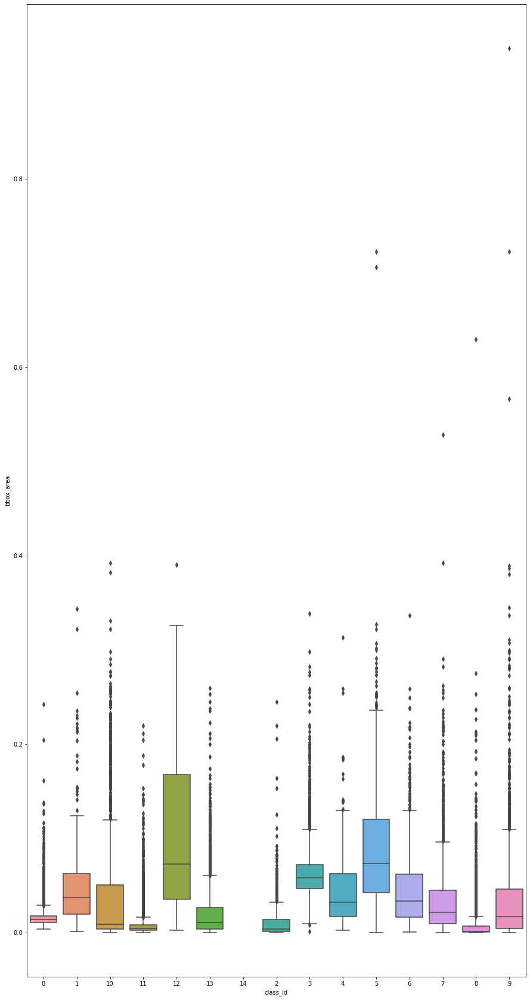

In [25]:
plt.figure(figsize=(15, 30), facecolor='white')
sns.boxplot(data=data, x='class_id', y='bbox_area')
plt.show()

Class 0


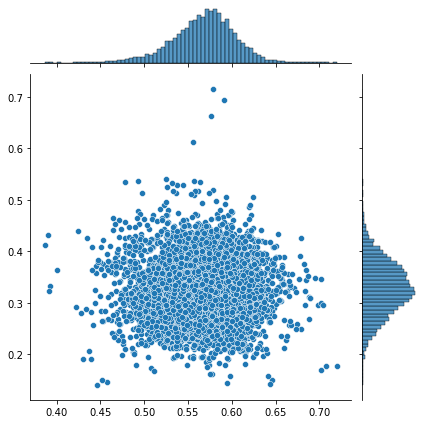

Class 1


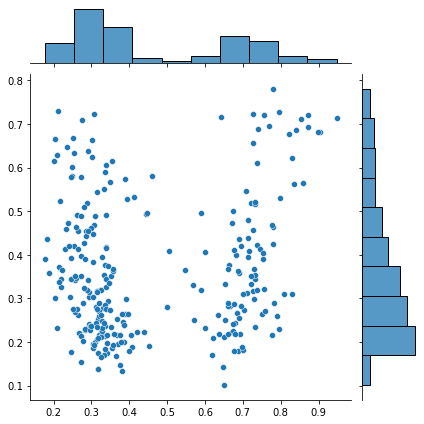

Class 2


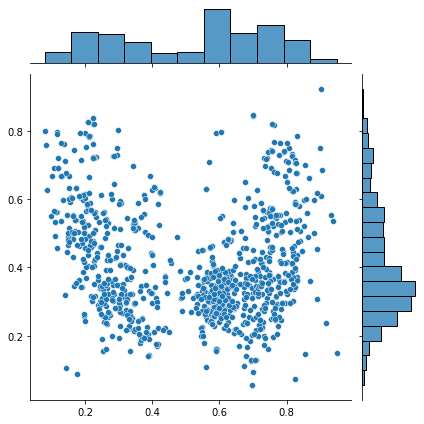

Class 3


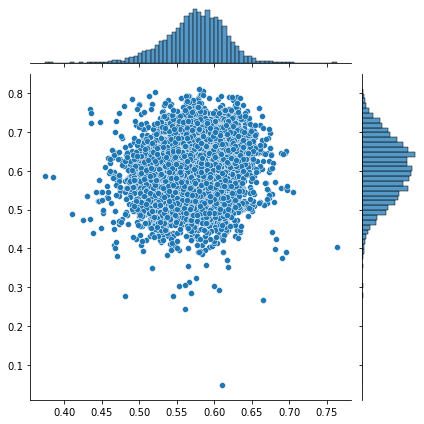

Class 4


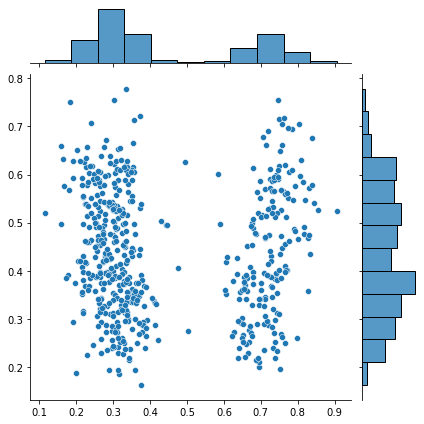

Class 5


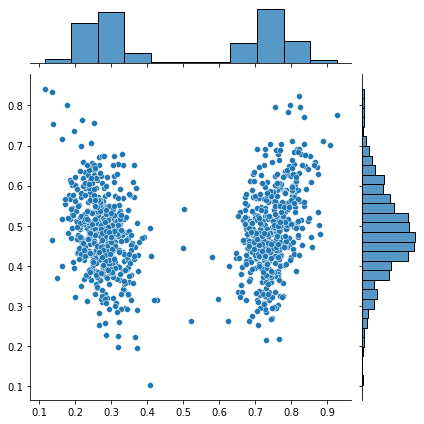

Class 6


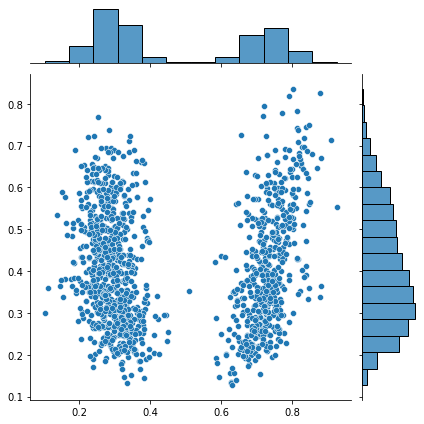

Class 7


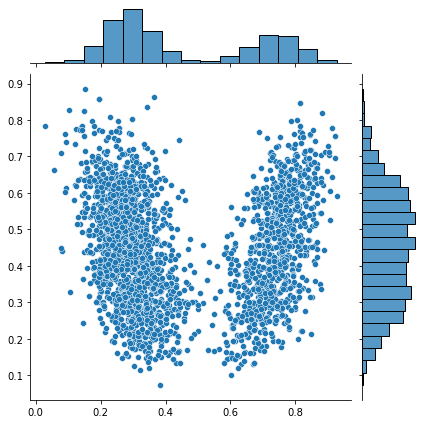

Class 8


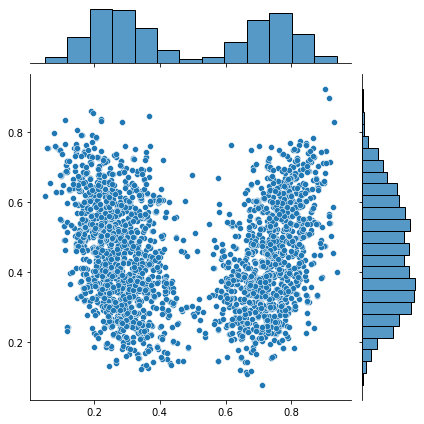

Class 9


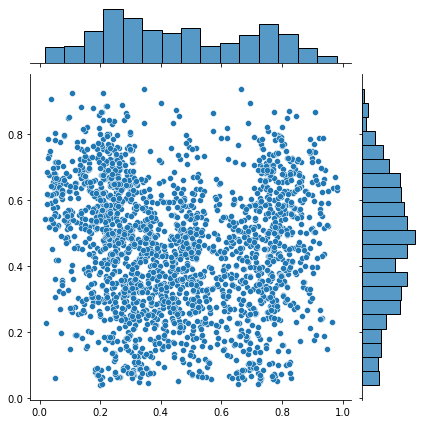

Class 10


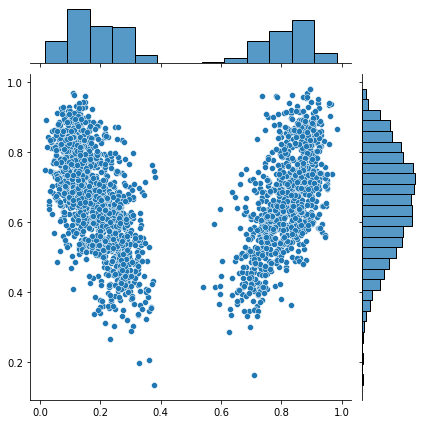

Class 11


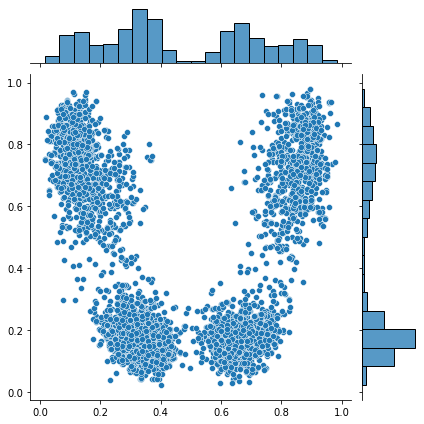

Class 12


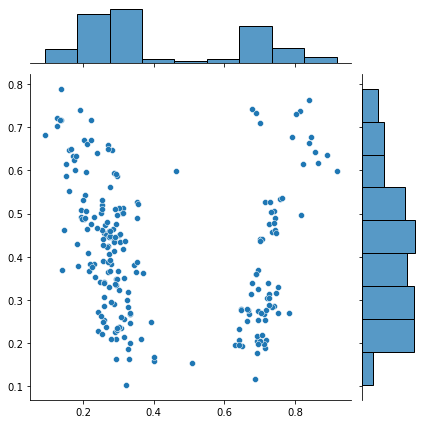

Class 13


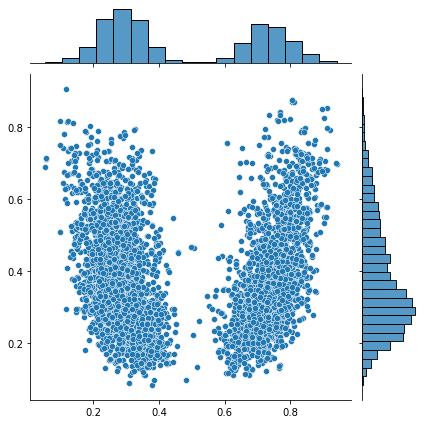

In [27]:
for i in range(14):
    print('Class', i)
    tmp = data[data['class_id'] == f'{i}']
    sns.jointplot(x=(tmp.x_max + tmp.x_min) / 2, y=(tmp.y_max + tmp.y_min) / 2)
    plt.show()

In [22]:
# Import dependencies
import plotly
import plotly.graph_objs as go
import numpy as np

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

for i in range(14):
    print('Class', i)

    tmp = data[data['class_id'] == str(i)]

    # Configure the trace.
    trace = go.Scatter3d(
        x=(tmp.x_min+tmp.x_max) / 2,
        y=(tmp.y_min+tmp.y_max) / 2,
        z=tmp.bbox_area,
        mode='markers',
        marker={
            'size': 1,
            'opacity': 0.8,
        }
    )

    # Configure the layout.
    layout = go.Layout(
        margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
    )

    plot_figure = go.Figure(data=[trace], layout=layout)

    # Render the plot.
    plotly.offline.iplot(plot_figure)

Class 0


Class 1


Class 2


Class 3


Class 4


Class 5


Class 6


Class 7


Class 8


Class 9


Class 10


Class 11


Class 12


Class 13
